
#Autism Modeling



##Libraries

In [1]:
pip install scikeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 98.3 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2


In [2]:
import pandas as pd
import numpy as np
from collections import Counter
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import callbacks, backend
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, Flatten, LSTM, Dense, SimpleRNN, GRU, TimeDistributed, Dropout, Input
from tensorflow.keras.losses import BinaryCrossentropy, CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasRegressor, KerasClassifier
import torch
from matplotlib import pyplot as plt
import os
import gc
import ctypes
import math
from statistics import mean
import seaborn as sns
import cv2
import zipfile
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder
from sklearn.multioutput import MultiOutputClassifier
import random

seed = 42
os.environ['PYTHONHASHSEED']=str(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

##Load Data

In [ ]:
autism_df = pd.read_csv('autism_processed.csv')
autism_df.head()

,Unnamed: 0,parent_author,parent_body,comment_author,comment_body,final_autism_ind,word_count,final_autism_ind_string,parent_body_new,comment_body_new
0,0,xraysty1e,"I try to stay silent on most topics on here, b...",ManicNoXanax,"same here, mom to autistic almost-9 year old. ...",0,290,0,try stay silent topic personally autism mother...,mom autistic almost-9 year old learn input oft...
1,1,pm_me_ur_tigbiddies,"Autistic 19 year old here, I just wanted to sa...",ManicNoXanax,Thank you so much for taking the time to share...,0,624,0,autistic 19 year old wanted say give kid oppor...,thank much taking time share thought advice ab...
2,2,betherlady,I’m so glad I came across your opinion in this...,ManicNoXanax,"Hey there, I'm glad my words were able to stri...",0,374,0,glad came across opinion post son 3 looking wa...,hey glad word able strike chord honestly would...
3,3,pm_me_ur_tigbiddies,You are fucking awesome!,ManicNoXanax,I think YOU'RE fucking awesome. Love hearing t...,0,303,0,fucking awesome,think fucking awesome love hearing found creat...
4,4,xraysty1e,"I try to stay silent on most topics on here, b...",zorro1701e,My son is 11. He’ll be 12 in July. We suspecte...,1,284,1,try stay silent topic personally autism mother...,son 11. 12 july suspected something around 2. ...


In [ ]:
autism_df_final = autism_df[['parent_body_new','final_autism_ind','comment_body_new']]
autism_df_final

,parent_body_new,final_autism_ind,comment_body_new
0,try stay silent topic personally autism mother...,0,mom autistic almost-9 year old learn input oft...
1,autistic 19 year old wanted say give kid oppor...,0,thank much taking time share thought advice ab...
2,glad came across opinion post son 3 looking wa...,0,hey glad word able strike chord honestly would...
3,fucking awesome,0,think fucking awesome love hearing found creat...
4,try stay silent topic personally autism mother...,1,son 11. 12 july suspected something around 2. ...
...,...,...,...
26201,thank,1,replying based comment lot store nowadays give...
26202,yes online chat two month ago cancel wifi serv...,1,former att employee company ask employee id as...
26203,dude need wash hand good dental hygiene going ...,1,honestly avoid eating spicy food mexican hopin...
26204,yes see comment thank many option hard decide ...,1,highly recommend one place right across street...


In [ ]:
target = autism_df_final['comment_body_new']
features = autism_df_final.drop(['comment_body_new'], axis=1)

X_train, X_other, y_train, y_other = train_test_split(features, target, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_other, y_other, test_size=0.5, random_state=42)

In [ ]:
X_train.reset_index(drop=True, inplace=True)
X_val.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)

##Translate Words to Numbers

In [ ]:
tokenizer = Tokenizer(num_words=10000)
tokenizer.fit_on_texts([str(features.loc[i]['parent_body_new']) for i in range(len(features))])

In [ ]:
X_train_seq = tokenizer.texts_to_sequences([str(X_train.loc[i]['parent_body_new']) for i in range(len(X_train))])
X_train_pad_seq = [pad_sequences([X_train_seq[i]], maxlen=1000)[0] for i in range(len(X_train_seq))]
X_val_seq = tokenizer.texts_to_sequences([str(X_val.loc[i]['parent_body_new']) for i in range(len(X_val))])
X_val_pad_seq = [pad_sequences([X_val_seq[i]], maxlen=1000)[0] for i in range(len(X_val_seq))]
X_test_seq = tokenizer.texts_to_sequences([str(X_test.loc[i]['parent_body_new']) for i in range(len(X_test))])
X_test_pad_seq = [pad_sequences([X_test_seq[i]], maxlen=1000)[0] for i in range(len(X_test_seq))]

In [ ]:
y_train.reset_index(drop=True, inplace=True)
y_val.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

In [ ]:
target_tokenizer = Tokenizer(num_words=10000)
target_tokenizer.fit_on_texts([str(target.loc[i]) for i in range(len(target))])

In [ ]:
y_train_seq = target_tokenizer.texts_to_sequences([str(y_train.loc[i]) for i in range(len(y_train))])
y_train_pad_seq = [pad_sequences([y_train_seq[i]], maxlen=1000)[0] for i in range(len(y_train_seq))]
y_val_seq = target_tokenizer.texts_to_sequences([str(y_val.loc[i]) for i in range(len(y_val))])
y_val_pad_seq = [pad_sequences([y_val_seq[i]], maxlen=1000)[0] for i in range(len(y_val_seq))]
y_test_seq = target_tokenizer.texts_to_sequences([str(y_test.loc[i]) for i in range(len(y_test))])
y_test_pad_seq = [pad_sequences([y_test_seq[i]], maxlen=1000)[0] for i in range(len(y_test_seq))]

In [ ]:
X_train_dict = dict()
for i in range(1000):
  k = f"body{i}"
  v = []
  for j in range(len(X_train_pad_seq)):
    v += [X_train_pad_seq[j][i]]
  X_train_dict[k] = v

X_val_dict = dict()
for i in range(1000):
  k = f"body{i}"
  v = []
  for j in range(len(X_val_pad_seq)):
    v += [X_val_pad_seq[j][i]]
  X_val_dict[k] = v

X_test_dict = dict()
for i in range(1000):
  k = f"body{i}"
  v = []
  for j in range(len(X_test_pad_seq)):
    v += [X_test_pad_seq[j][i]]
  X_test_dict[k] = v

y_train_dict = dict()
for i in range(1000):
  k = f"body{i}"
  v = []
  for j in range(len(y_train_pad_seq)):
    v += [y_train_pad_seq[j][i]]
  y_train_dict[k] = v

y_val_dict = dict()
for i in range(1000):
  k = f"body{i}"
  v = []
  for j in range(len(y_val_pad_seq)):
    v += [y_val_pad_seq[j][i]]
  y_val_dict[k] = v

y_test_dict = dict()
for i in range(1000):
  k = f"body{i}"
  v = []
  for j in range(len(y_test_pad_seq)):
    v += [y_test_pad_seq[j][i]]
  y_test_dict[k] = v

In [ ]:
X_train_final = pd.DataFrame.from_dict(X_train_dict)
X_train_final['final_autism_ind'] = X_train['final_autism_ind']
X_val_final = pd.DataFrame.from_dict(X_val_dict)
X_val_final['final_autism_ind'] = X_val['final_autism_ind']
X_test_final = pd.DataFrame.from_dict(X_test_dict)
X_test_final['final_autism_ind'] = X_test['final_autism_ind']
y_train_final = pd.DataFrame.from_dict(y_train_dict)
y_val_final = pd.DataFrame.from_dict(y_val_dict)
y_test_final = pd.DataFrame.from_dict(y_test_dict)

In [ ]:
X_train_final.to_csv('X_train_final.csv')
X_val_final.to_csv('X_val_final.csv')
X_test_final.to_csv('X_test_final.csv')
y_train_final.to_csv('y_train_final.csv')
y_val_final.to_csv('y_val_final.csv')
y_test_final.to_csv('y_test_final.csv')

In [ ]:
X_train_final = pd.read_csv('X_train_final.csv')
X_val_final = pd.read_csv('X_val_final.csv')
X_test_final = pd.read_csv('X_test_final.csv')
y_train_final = pd.read_csv('y_train_final.csv')
y_val_final = pd.read_csv('y_val_final.csv')
y_test_final = pd.read_csv('y_test_final.csv')

In [ ]:
X_train_concat = np.concatenate([X_train_final,X_val_final,X_test_final],axis=0)
y_train_concat = np.concatenate([y_train_final,y_val_final,y_test_final],axis=0)

In [ ]:
X_y_comb = np.concatenate([X_train_concat,y_train_concat],axis=1)

In [ ]:
X_concat_df = pd.DataFrame(X_train_concat, columns=X_train_final.columns)
y_concat_df = pd.DataFrame(y_train_concat, columns=y_train_final.columns)

In [ ]:
col_list1 = X_train_final.columns.tolist()
col_list2 = [f"targ{i}" for i in range(len(y_train_final.columns))]
col_list = col_list1 + col_list2

In [ ]:
X_y_df = pd.DataFrame(X_y_comb, columns=col_list)

In [ ]:
X_y_df

,body0,body1,body2,body3,body4,body5,body6,body7,body8,body9,...,targ990,targ991,targ992,targ993,targ994,targ995,targ996,targ997,targ998,targ999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1249,9889,474,1851,3642
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,100,3182
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,74,5318,6760,2834,2345
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7608
4,0,0,0,0,0,0,0,0,0,0,...,30,38,96,1,2,159,32,4271,346,163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26201,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,130,280,8302,3569
26202,0,0,0,0,0,0,0,0,0,0,...,2734,175,9193,1551,5,7,170,499,6,1551
26203,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,5,6756,987,54,1301,4623
26204,0,0,0,0,0,0,0,0,0,0,...,0,110,1,23,227,153,13,5389,210,70


In [ ]:
X_concat_df

,body0,body1,body2,body3,body4,body5,body6,body7,body8,body9,...,body991,body992,body993,body994,body995,body996,body997,body998,body999,final_autism_ind
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,356,843,25,1
1,0,0,0,0,0,0,0,0,0,0,...,3,3498,6320,167,2562,1235,43,185,339,0
2,0,0,0,0,0,0,0,0,0,0,...,142,2204,756,142,1354,756,484,78,1149,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1917,1434,331,2300,1
4,0,0,0,0,0,0,0,0,0,0,...,2857,18,9179,377,6,358,16,1653,5300,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26201,0,0,0,0,0,0,0,0,0,0,...,199,405,3067,467,8659,236,3121,3192,262,1
26202,0,0,0,0,0,0,0,0,0,0,...,533,116,5,159,769,1327,127,43,1094,0
26203,0,0,0,0,0,0,0,0,0,0,...,5808,4,221,493,51,961,6437,1343,151,0
26204,0,0,0,0,0,0,0,0,0,0,...,2780,976,177,27,2647,4768,6378,7,26,0


##Exploratory Data Analysis

In [ ]:
missing_sum = X_y_df.isna().sum()
missing_sum

,0
body0,0
body1,0
body2,0
body3,0
body4,0
body5,0
body6,0
body7,0
body8,0
body9,0


In [ ]:
max(missing_sum)

0

In [ ]:
X_y_df_describe = X_y_df.describe().T
X_y_df_describe

,count,mean,std,min,25%,50%,75%,max
body0,26206.0,0.189689,16.114007,0.0,0.0,0.0,0.00,2335.0
body1,26206.0,0.942074,69.429545,0.0,0.0,0.0,0.00,8688.0
body2,26206.0,0.749523,57.014624,0.0,0.0,0.0,0.00,6814.0
body3,26206.0,0.358544,32.415455,0.0,0.0,0.0,0.00,3621.0
body4,26206.0,0.665535,60.836737,0.0,0.0,0.0,0.00,6581.0
...,...,...,...,...,...,...,...,...
targ995,26206.0,930.813211,1782.247098,0.0,4.0,143.0,898.00,9997.0
targ996,26206.0,960.774632,1755.251451,0.0,14.0,176.0,988.00,9991.0
targ997,26206.0,1042.876975,1814.016753,0.0,29.0,230.0,1131.00,9999.0
targ998,26206.0,1196.243494,1947.821050,0.0,52.0,319.0,1374.75,9994.0


In [ ]:
X_y_df['body0'].groupby(X_y_df['final_autism_ind']).count()

,body0
final_autism_ind,
0,8063
1,18143


In [ ]:
X_y_df_describe[X_y_df_describe['75%']==0]

,count,mean,std,min,25%,50%,75%,max
body0,26206.0,0.189689,16.114007,0.0,0.0,0.0,0.0,2335.0
body1,26206.0,0.942074,69.429545,0.0,0.0,0.0,0.0,8688.0
body2,26206.0,0.749523,57.014624,0.0,0.0,0.0,0.0,6814.0
body3,26206.0,0.358544,32.415455,0.0,0.0,0.0,0.0,3621.0
body4,26206.0,0.665535,60.836737,0.0,0.0,0.0,0.0,6581.0
...,...,...,...,...,...,...,...,...
targ967,26206.0,244.354728,971.374904,0.0,0.0,0.0,0.0,9998.0
targ968,26206.0,253.656834,988.266927,0.0,0.0,0.0,0.0,9992.0
targ969,26206.0,273.683469,1044.514350,0.0,0.0,0.0,0.0,9990.0
targ970,26206.0,279.279135,1033.566408,0.0,0.0,0.0,0.0,9963.0


In [ ]:
zero_count_dict = dict()
for i in range(len(X_y_df.columns)):
  zero_count = 0
  for j in range(len(X_y_df)):
    if X_y_df[X_y_df.columns[i]][j] == 0:
      zero_count += 1
  zero_count_dict[X_y_df.columns[i]] = zero_count

In [ ]:
zero_count_dict

{'body0': 26197,
 'body1': 26197,
 'body2': 26196,
 'body3': 26196,
 'body4': 26196,
 'body5': 26196,
 'body6': 26196,
 'body7': 26196,
 'body8': 26196,
 'body9': 26196,
 'body10': 26196,
 'body11': 26196,
 'body12': 26196,
 'body13': 26196,
 'body14': 26196,
 'body15': 26196,
 'body16': 26196,
 'body17': 26196,
 'body18': 26196,
 'body19': 26196,
 'body20': 26196,
 'body21': 26196,
 'body22': 26196,
 'body23': 26196,
 'body24': 26196,
 'body25': 26196,
 'body26': 26196,
 'body27': 26196,
 'body28': 26196,
 'body29': 26196,
 'body30': 26196,
 'body31': 26196,
 'body32': 26196,
 'body33': 26196,
 'body34': 26196,
 'body35': 26196,
 'body36': 26196,
 'body37': 26196,
 'body38': 26196,
 'body39': 26196,
 'body40': 26196,
 'body41': 26196,
 'body42': 26196,
 'body43': 26196,
 'body44': 26196,
 'body45': 26196,
 'body46': 26196,
 'body47': 26196,
 'body48': 26196,
 'body49': 26196,
 'body50': 26196,
 'body51': 26196,
 'body52': 26196,
 'body53': 26196,
 'body54': 26196,
 'body55': 26196,
 '

In [ ]:
zero_count_df = pd.DataFrame.from_dict(zero_count_dict,orient='index',columns=['zero_count'])

In [ ]:
zero_count_df.reset_index(inplace=True)

In [ ]:
zero_count_df[zero_count_df['index'].str.contains('targ')][zero_count_df['zero_count']>25700]

<ipython-input-23-bb5fcf67b311>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  zero_count_df[zero_count_df['index'].str.contains('targ')][zero_count_df['zero_count']>25700]


,index,zero_count
1001,targ0,26206
1002,targ1,26206
1003,targ2,26206
1004,targ3,26206
1005,targ4,26206
...,...,...
1869,targ868,25748
1870,targ869,25742
1871,targ870,25732
1872,targ871,25721


In [ ]:
X_concat_df[X_concat_df.body767 != 0]

,body0,body1,body2,body3,body4,body5,body6,body7,body8,body9,...,body991,body992,body993,body994,body995,body996,body997,body998,body999,final_autism_ind
71,0,0,0,0,0,0,0,0,0,0,...,287,1719,80,49,100,1943,534,2403,1,1
129,0,0,0,0,0,0,0,0,0,0,...,1731,6868,473,1640,2159,3489,2412,2317,2878,1
233,0,0,0,0,0,0,0,0,0,0,...,643,4390,7269,7571,6380,8543,3278,338,2731,0
281,0,0,0,0,0,0,0,0,0,0,...,226,2046,5165,4507,13,975,2282,3168,5543,1
294,0,0,0,0,0,0,0,0,0,0,...,40,4,7329,128,76,698,7,1323,156,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25988,0,0,0,0,0,0,0,0,0,0,...,771,3933,953,7289,891,1316,810,968,520,0
26010,0,0,0,0,0,0,0,0,0,0,...,655,295,1462,14,289,543,85,4068,688,1
26047,0,0,0,0,0,0,0,0,0,0,...,6658,62,558,517,729,20,937,106,156,1
26179,0,0,0,0,0,0,0,0,0,0,...,773,23,795,476,526,773,1290,1367,900,1


In [ ]:
drop_col = []
for i in range(768):
  colname = f"body{i}"
  drop_col += [colname]
for i in range(873):
  colname = f"targ{i}"
  drop_col += [colname]

filter_X_df = X_y_df[X_y_df['body767'] == 0][X_y_df['body999'] != 0][X_y_df['targ872'] == 0][X_y_df['targ999'] != 0].drop(drop_col,axis=1)

<ipython-input-24-59ecf1073e54>:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filter_X_df = X_y_df[X_y_df['body767'] == 0][X_y_df['body999'] != 0][X_y_df['targ872'] == 0][X_y_df['targ999'] != 0].drop(drop_col,axis=1)
<ipython-input-24-59ecf1073e54>:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filter_X_df = X_y_df[X_y_df['body767'] == 0][X_y_df['body999'] != 0][X_y_df['targ872'] == 0][X_y_df['targ999'] != 0].drop(drop_col,axis=1)
<ipython-input-24-59ecf1073e54>:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filter_X_df = X_y_df[X_y_df['body767'] == 0][X_y_df['body999'] != 0][X_y_df['targ872'] == 0][X_y_df['targ999'] != 0].drop(drop_col,axis=1)


In [ ]:
filter_X_df.reset_index(drop=True, inplace=True)

In [ ]:
filter_X_df

,body768,body769,body770,body771,body772,body773,body774,body775,body776,body777,...,targ990,targ991,targ992,targ993,targ994,targ995,targ996,targ997,targ998,targ999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1249,9889,474,1851,3642
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,100,3182
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,74,5318,6760,2834,2345
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7608
4,0,0,0,0,0,0,0,0,0,0,...,30,38,96,1,2,159,32,4271,346,163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24800,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,130,280,8302,3569
24801,0,0,0,0,0,0,0,0,0,0,...,2734,175,9193,1551,5,7,170,499,6,1551
24802,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,5,6756,987,54,1301,4623
24803,0,0,0,0,0,0,0,0,0,0,...,0,110,1,23,227,153,13,5389,210,70


In [ ]:
targ_col = [f"targ{i}" for i in range(873,1000)]
for col in range(len(targ_col)):
  s = filter_X_df[targ_col[col]].groupby(filter_X_df[targ_col[col]]).count()
  if col == 0:
    targ_word_count = pd.DataFrame(s)
  else:
    targ_word_count = pd.concat([targ_word_count,s],axis=1)

In [ ]:
targ_word_count

,targ873,targ874,targ875,targ876,targ877,targ878,targ879,targ880,targ881,targ882,...,targ990,targ991,targ992,targ993,targ994,targ995,targ996,targ997,targ998,targ999
0,24793.0,24782.0,24774.0,24763.0,24759.0,24750.0,24738.0,24733.0,24724.0,24713.0,...,10253.0,9385.0,8510.0,7546.0,6494.0,5353.0,4105.0,2737.0,1348.0,NaN
2,1.0,NaN,1.0,1.0,NaN,1.0,2.0,NaN,NaN,NaN,...,154.0,176.0,166.0,178.0,223.0,235.0,247.0,270.0,154.0,34.0
8,2.0,2.0,1.0,NaN,1.0,2.0,NaN,1.0,1.0,1.0,...,95.0,100.0,109.0,99.0,115.0,142.0,127.0,105.0,94.0,58.0
9,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,91.0,97.0,103.0,105.0,106.0,128.0,146.0,138.0,138.0,115.0
47,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,35.0,50.0,55.0,43.0,45.0,61.0,44.0,55.0,46.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
7583,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0
8964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0
9470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0


In [ ]:
targ_word_count.T

,0,2,8,9,47,52,82,89,110,254,...,8364,8609,9679,9707,7518,7528,7583,8964,9470,9874
targ873,24793.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ874,24782.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ875,24774.0,1.0,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ876,24763.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ877,24759.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
targ995,5353.0,235.0,142.0,128.0,61.0,52.0,33.0,37.0,35.0,9.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ996,4105.0,247.0,127.0,146.0,44.0,54.0,34.0,49.0,40.0,13.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ997,2737.0,270.0,105.0,138.0,55.0,62.0,34.0,56.0,32.0,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
targ998,1348.0,154.0,94.0,138.0,46.0,49.0,24.0,148.0,41.0,4.0,...,1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
targ_word_desc = targ_word_count.T.describe().T
targ_word_desc.reset_index(inplace=True)
targ_word_desc

,index,count,mean,std,min,25%,50%,75%,max
0,0,126.0,20976.063492,5242.370824,1348.0,19925.0,23288.0,24375.75,24793.0
1,2,118.0,42.372881,57.507011,1.0,6.0,16.5,53.25,270.0
2,8,120.0,25.066667,32.294270,1.0,3.0,10.0,35.00,142.0
3,9,115.0,25.226087,34.487237,1.0,3.5,9.0,31.00,146.0
4,47,102.0,12.460784,14.640694,1.0,2.0,7.0,17.75,61.0
...,...,...,...,...,...,...,...,...,...
9950,7528,1.0,4.000000,NaN,4.0,4.0,4.0,4.00,4.0
9951,7583,1.0,7.000000,NaN,7.0,7.0,7.0,7.00,7.0
9952,8964,1.0,6.000000,NaN,6.0,6.0,6.0,6.00,6.0
9953,9470,1.0,5.000000,NaN,5.0,5.0,5.0,5.00,5.0


In [ ]:
num_approx = []
for i in range(len(targ_word_desc)):
  num_approx += [targ_word_desc['count'][i]*targ_word_desc['mean'][i]]
targ_word_desc['num_approx'] = num_approx

In [ ]:
targ_word_desc

,index,count,mean,std,min,25%,50%,75%,max,num_approx
0,0,126.0,20976.063492,5242.370824,1348.0,19925.0,23288.0,24375.75,24793.0,2642984.0
1,2,118.0,42.372881,57.507011,1.0,6.0,16.5,53.25,270.0,5000.0
2,8,120.0,25.066667,32.294270,1.0,3.0,10.0,35.00,142.0,3008.0
3,9,115.0,25.226087,34.487237,1.0,3.5,9.0,31.00,146.0,2901.0
4,47,102.0,12.460784,14.640694,1.0,2.0,7.0,17.75,61.0,1271.0
...,...,...,...,...,...,...,...,...,...,...
9950,7528,1.0,4.000000,NaN,4.0,4.0,4.0,4.00,4.0,4.0
9951,7583,1.0,7.000000,NaN,7.0,7.0,7.0,7.00,7.0,7.0
9952,8964,1.0,6.000000,NaN,6.0,6.0,6.0,6.00,6.0,6.0
9953,9470,1.0,5.000000,NaN,5.0,5.0,5.0,5.00,5.0,5.0


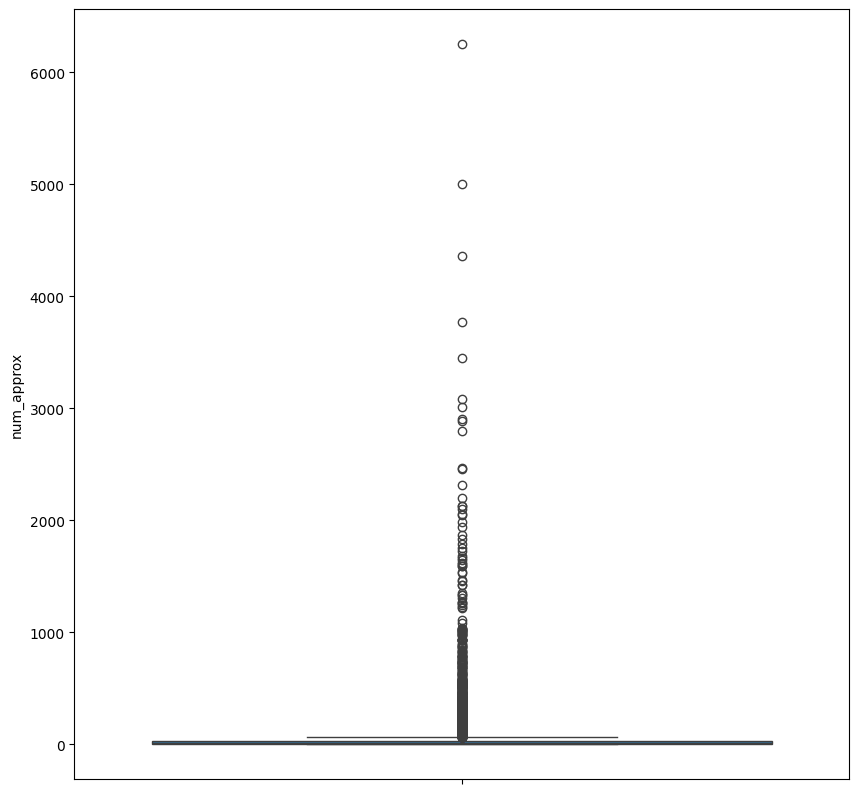

In [ ]:
plt.figure(figsize = (10,10))
sns.boxplot(targ_word_desc[targ_word_desc['index'] != 0]['num_approx'])
plt.show()

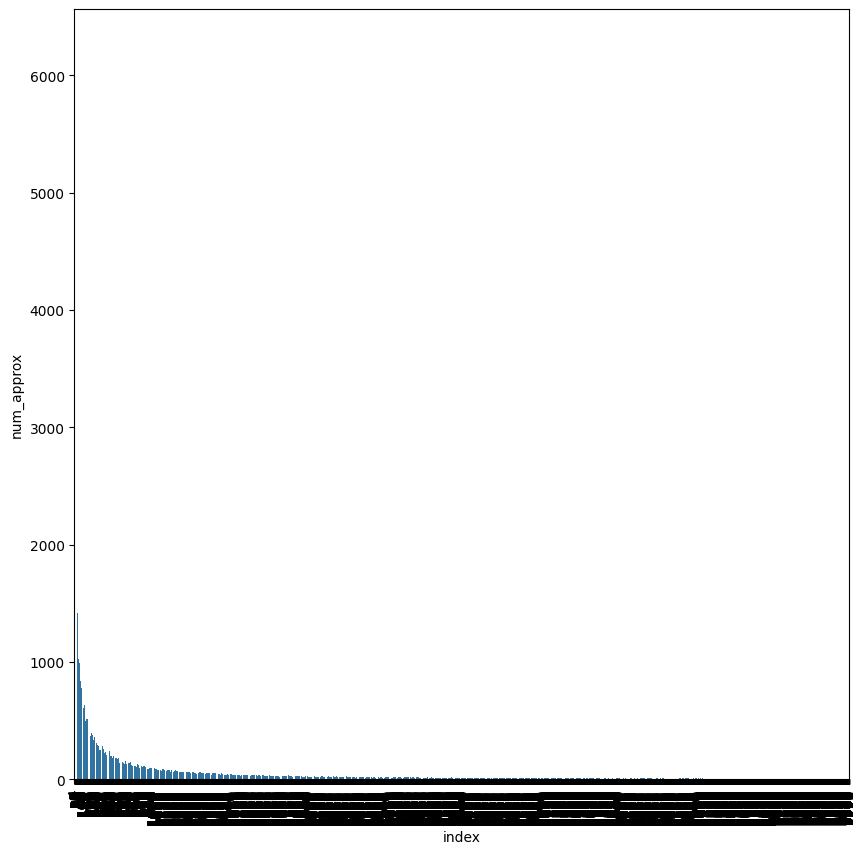

In [ ]:
plt.figure(figsize = (10,10))
sns.barplot(x=targ_word_desc[targ_word_desc['index'] != 0]['index'],y=targ_word_desc[targ_word_desc['index'] != 0]['num_approx'])
plt.xticks(rotation=90)
plt.show()

In [ ]:
targ_word_desc[targ_word_desc['index']==82]

,index,count,mean,std,min,25%,50%,75%,max,num_approx
6,82,78.0,11.974359,46.985484,1.0,1.0,3.0,9.0,415.0,934.0


In [ ]:
targ_word_large = targ_word_desc[targ_word_desc['num_approx']>=1000]
targ_word_large

,index,count,mean,std,min,25%,50%,75%,max,num_approx
0,0,126.0,20976.063492,5242.370824,1348.0,19925.00,23288.0,24375.75,24793.0,2642984.0
1,2,118.0,42.372881,57.507011,1.0,6.00,16.5,53.25,270.0,5000.0
2,8,120.0,25.066667,32.294270,1.0,3.00,10.0,35.00,142.0,3008.0
3,9,115.0,25.226087,34.487237,1.0,3.50,9.0,31.00,146.0,2901.0
4,47,102.0,12.460784,14.640694,1.0,2.00,7.0,17.75,61.0,1271.0
...,...,...,...,...,...,...,...,...,...,...
499,58,90.0,11.211111,14.267504,1.0,3.00,5.5,15.75,79.0,1009.0
569,36,98.0,14.938776,19.979792,1.0,2.25,7.0,19.50,127.0,1464.0
571,63,99.0,10.353535,12.322464,1.0,2.00,4.0,13.00,46.0,1025.0
780,53,101.0,10.178218,11.161896,1.0,2.00,6.0,14.00,51.0,1028.0


In [ ]:
targ_word_large['index'].tolist()

[0,
 2,
 8,
 9,
 47,
 52,
 7,
 14,
 28,
 32,
 44,
 24,
 29,
 30,
 46,
 5,
 6,
 45,
 50,
 17,
 18,
 33,
 40,
 42,
 43,
 56,
 57,
 67,
 1,
 10,
 15,
 20,
 21,
 34,
 37,
 38,
 3,
 11,
 31,
 54,
 69,
 22,
 23,
 26,
 48,
 4,
 13,
 25,
 49,
 60,
 16,
 19,
 27,
 12,
 35,
 51,
 39,
 58,
 36,
 63,
 53,
 41]

In [ ]:
target_tokenizer.sequences_to_texts([targ_word_large['index'].tolist()])

["would think know someone find thing really work say well good autistic something u one time right parent way feel going love autism got person ’ sure like also need much year day see never people '' child 's though could lot “ always get even go look said want kid ” make still better life back help actually first take"]

In [ ]:
targ_word_small = targ_word_desc[targ_word_desc['num_approx']<=2]
targ_word_small

,index,count,mean,std,min,25%,50%,75%,max,num_approx
373,9306,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
765,4462,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
853,7439,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
1328,8947,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
1407,9409,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...
9946,8609,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
9947,9679,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
9948,9707,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0
9949,7518,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
word_drop = targ_word_small['index'].tolist()
word_drop += [82]

In [ ]:
for i in range(len(targ_col)):
  filter_X_df = filter_X_df[filter_X_df[targ_col[i]].isin(word_drop) == False]

In [ ]:
filter_X_df.reset_index(drop=True, inplace=True)
filter_X_df

,body768,body769,body770,body771,body772,body773,body774,body775,body776,body777,...,targ990,targ991,targ992,targ993,targ994,targ995,targ996,targ997,targ998,targ999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1249,9889,474,1851,3642
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,100,3182
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,74,5318,6760,2834,2345
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7608
4,0,0,0,0,0,0,0,0,0,0,...,30,38,96,1,2,159,32,4271,346,163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23707,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,130,280,8302,3569
23708,0,0,0,0,0,0,0,0,0,0,...,2734,175,9193,1551,5,7,170,499,6,1551
23709,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,5,6756,987,54,1301,4623
23710,0,0,0,0,0,0,0,0,0,0,...,0,110,1,23,227,153,13,5389,210,70


In [ ]:
filter_short_df = filter_X_df[filter_X_df['targ998'] != 0]

In [ ]:
filter_short_df.reset_index(drop=True, inplace=True)
filter_short_df

,body768,body769,body770,body771,body772,body773,body774,body775,body776,body777,...,targ990,targ991,targ992,targ993,targ994,targ995,targ996,targ997,targ998,targ999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1249,9889,474,1851,3642
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,100,3182
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,74,5318,6760,2834,2345
3,0,0,0,0,0,0,0,0,0,0,...,30,38,96,1,2,159,32,4271,346,163
4,0,0,0,0,0,0,0,0,0,0,...,64,34,111,718,1544,2246,12,87,1166,392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22374,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,130,280,8302,3569
22375,0,0,0,0,0,0,0,0,0,0,...,2734,175,9193,1551,5,7,170,499,6,1551
22376,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,5,6756,987,54,1301,4623
22377,0,0,0,0,0,0,0,0,0,0,...,0,110,1,23,227,153,13,5389,210,70


In [ ]:
body_col = [f"body{i}" for i in range(768,1000)]
feat_col = body_col + ['final_autism_ind']

In [ ]:
feature_new = filter_short_df[feat_col]
target_new = filter_short_df[targ_col]
X_train_new, X_other_new, y_train_new, y_other_new = train_test_split(feature_new, target_new, test_size=0.3, random_state=42)
X_val_new, X_test_new, y_val_new, y_test_new = train_test_split(X_other_new, y_other_new, test_size=0.5, random_state=42)


In [ ]:
X_train_new.reset_index(drop=True, inplace=True)
X_val_new.reset_index(drop=True, inplace=True)
X_test_new.reset_index(drop=True, inplace=True)
y_train_new.reset_index(drop=True, inplace=True)
y_val_new.reset_index(drop=True, inplace=True)
y_test_new.reset_index(drop=True, inplace=True)

In [ ]:
X_train_new.to_csv('X_train_final_new.csv')
X_val_new.to_csv('X_val_final_new.csv')
X_test_new.to_csv('X_test_final_new.csv')
y_train_new.to_csv('y_train_final_new.csv')
y_val_new.to_csv('y_val_final_new.csv')
y_test_new.to_csv('y_test_final_new.csv')

##Modeling Preparation

In [3]:
X_train_final_all = pd.read_csv('X_train_final_new.csv')
X_val_final_all = pd.read_csv('X_val_final_new.csv')
X_test_final_all = pd.read_csv('X_test_final_new.csv')
y_train_final_all = pd.read_csv('y_train_final_new.csv')
y_val_final_all = pd.read_csv('y_val_final_new.csv')
y_test_final_all = pd.read_csv('y_test_final_new.csv')

In [4]:
X_train_final_all.drop(columns=['Unnamed: 0'], inplace=True)
X_val_final_all.drop(columns=['Unnamed: 0'], inplace=True)
X_test_final_all.drop(columns=['Unnamed: 0'], inplace=True)
y_train_final_all.drop(columns=['Unnamed: 0'], inplace=True)
y_val_final_all.drop(columns=['Unnamed: 0'], inplace=True)
y_test_final_all.drop(columns=['Unnamed: 0'], inplace=True)

In [5]:
X_train_final_new = X_train_final_all.sample(frac=0.1,random_state=42).reset_index(drop=True)
X_val_final_new = X_val_final_all.sample(frac=0.1,random_state=42).reset_index(drop=True)
X_test_final_new = X_test_final_all.sample(frac=0.1,random_state=42).reset_index(drop=True)
y_train_final_new = y_train_final_all.sample(frac=0.1,random_state=42).reset_index(drop=True)
y_val_final_new = y_val_final_all.sample(frac=0.1,random_state=42).reset_index(drop=True)
y_test_final_new = y_test_final_all.sample(frac=0.1,random_state=42).reset_index(drop=True)

In [ ]:
y_test_final_new

,targ873,targ874,targ875,targ876,targ877,targ878,targ879,targ880,targ881,targ882,...,targ990,targ991,targ992,targ993,targ994,targ995,targ996,targ997,targ998,targ999
0,0,0,0,0,0,0,0,0,0,0,...,8911,74,2928,41,977,859,1492,1199,5861,356
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,436,1315
2,0,0,0,0,0,0,0,0,0,0,...,799,72,34,83,5074,9754,7,2067,8686,1173
3,0,0,0,0,0,0,0,0,0,0,...,139,557,44,85,800,102,307,464,169,557
4,0,0,0,0,0,0,0,0,0,0,...,1654,892,692,83,3703,5605,1071,1447,121,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,0,0,0,0,0,0,0,0,0,0,...,1549,21,549,6,921,19,181,435,106,231
332,0,0,0,0,0,0,0,0,0,0,...,1817,766,1225,1126,83,356,15,1093,7,9723
333,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,37,886,906
334,0,0,0,0,0,0,0,0,0,0,...,84,32,1250,1341,1980,892,120,20,204,9


In [6]:
ohe_train = OneHotEncoder(categories=[[i for i in range(10000)] for j in range(127)] ,sparse_output=True)
ohe_val = OneHotEncoder(categories=[[i for i in range(10000)] for j in range(127)] ,sparse_output=True)
ohe_test = OneHotEncoder(categories=[[i for i in range(10000)] for j in range(127)] ,sparse_output=True)

In [7]:
y_train_new_ohe = ohe_train.fit_transform(y_train_final_new)
y_val_new_ohe = ohe_val.fit_transform(y_val_final_new)
y_test_new_ohe = ohe_test.fit_transform(y_test_final_new)

In [8]:
y_train_ohe_arr = y_train_new_ohe.toarray()
y_test_ohe_arr = y_test_new_ohe.toarray()
y_val_ohe_arr = y_val_new_ohe.toarray()

In [9]:
y_train_arr_reshape = y_train_ohe_arr.reshape((1566,127,10000))
y_val_arr_reshape = y_val_ohe_arr.reshape((336,127,10000))
y_test_arr_reshape = y_test_ohe_arr.reshape((336,127,10000))

In [10]:
X_train_final = X_train_final_new.to_numpy().reshape((X_train_final_new.shape[0],1,X_train_final_new.shape[1]))
X_val_final = X_val_final_new.to_numpy().reshape((X_val_final_new.shape[0],1,X_val_final_new.shape[1]))
X_test_final = X_test_final_new.to_numpy().reshape((X_test_final_new.shape[0],1,X_test_final_new.shape[1]))
y_train_final = y_train_arr_reshape
y_val_final = y_val_arr_reshape
y_test_final = y_test_arr_reshape
batch_size = 32
steps_per_epoch = len(X_train_final) // batch_size
train_data = tf.data.Dataset.from_tensor_slices((X_train_final, y_train_final))
train_data = train_data.repeat().batch(batch_size,drop_remainder=True)
val_data = tf.data.Dataset.from_tensor_slices((X_val_final, y_val_final))
val_data = val_data.repeat().batch(batch_size,drop_remainder=True)
test_data = tf.data.Dataset.from_tensor_slices((X_test_final, y_test_final))
test_data = test_data.repeat().batch(batch_size,drop_remainder=True)

##Modeling

In [ ]:
#Function to add given # of layers with given # of neurons
@keras.utils.register_keras_serializable(package="my_package", name="add_layer")
def add_output_layer(model,num_layer,neurons):
  #output_list = []
  for i in range(num_layer):
    if i==0:
      layer = SimpleRNN(neurons, activation='relu', return_sequences=True)(model)
    else:
      layer = SimpleRNN(neurons, activation='relu', return_sequences=True)(layer)
    #output_list += [layer]
  #return output_list
  return layer

In [11]:
#Create callback to save the weights after each epoch
class customCallback(callbacks.Callback):
  def on_train_begin(self,logs=None):
    self.model.all_weights = []
  def on_epoch_end(self,epoch,logs=None):
    self.weight_list = []
    for layer in self.model.layers:
      if layer.get_weights() == []:
        self.weight_list += [np.nan]
      else:
        self.weight_list += [np.mean(layer.get_weights()[0])]
    self.model.all_weights += [self.weight_list]

In [ ]:
def create_rnn(input_shape):
    input_shape = input_shape
    inputs = Input(shape=input_shape)
    model = SimpleRNN(50, activation='tanh', return_sequences=True)(inputs)
    outlist = []
    for out in range(127):
        outlist += [Dense(10000, activation='softmax')(model)]
    opt = tf.keras.optimizers.Adam(learning_rate=0.00003, beta_1=0.9, beta_2=0.999)
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    return final_model

# Example input shape, will be in form of our data
input_shape = (X_train_final.shape[1],X_train_final.shape[2])  # 2 features, 1 row per input
#inp_shape = (1,1001)
#input_shape = (None,X_train_final.shape[2])
rnn_model = create_rnn(input_shape)
type(rnn_model)
rnn_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 233)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn (SimpleRNN)    │ (None, 1, 50)          │         14,200 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_14 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 1, 10000)       │        510,000 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_17 (Dense)     

 Total params: 64,784,200 (247.13 MB)

 Trainable params: 64,784,200 (247.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
rnn_model_history = rnn_model.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - categorical_accuracy: 2.2904e-04 - loss: 9.2015 - val_categorical_accuracy: 5.3826e-04 - val_loss: 9.1836
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - categorical_accuracy: 6.3666e-04 - loss: 9.1734 - val_categorical_accuracy: 0.0014 - val_loss: 9.1561
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - categorical_accuracy: 0.0026 - loss: 9.1417 - val_categorical_accuracy: 0.0052 - val_loss: 9.1257
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - categorical_accuracy: 0.0090 - loss: 9.1074 - val_categorical_accuracy: 0.0187 - val_loss: 9.0938
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 76s 2s/step - categorical_accuracy: 0.0273 - loss: 9.0719 - val_categorical_accuracy: 0.0482 - val_loss: 9.0604


In [ ]:
model_df = pd.DataFrame(columns=['epoch','train_accuracy','val_accuracy','train_loss','val_loss'])
model_df['epoch'] = rnn_model_history.epoch
model_df['train_accuracy'] = rnn_model_history.history['categorical_accuracy']
model_df['val_accuracy'] = rnn_model_history.history['val_categorical_accuracy']
model_df['train_loss'] = rnn_model_history.history['loss']
model_df['val_loss'] = rnn_model_history.history['val_loss']

name = []
for layer in rnn_model.layers:
  name += [str(type(layer)).split("'")[1].split(".")[5]]
name_count = pd.Series(name).value_counts()
name_count_dict = name_count.to_dict()
for i in name_count_dict.keys():
  start = 0
  for j in range(name_count_dict[i]):
    ind = name.index(i,start)
    name[ind] = str(name[ind]) + str(j + 1)
    start = j + 1
model_layers = pd.DataFrame(columns=name)
for i,w in enumerate(rnn_model.all_weights):
  model_layers.loc[i] = w

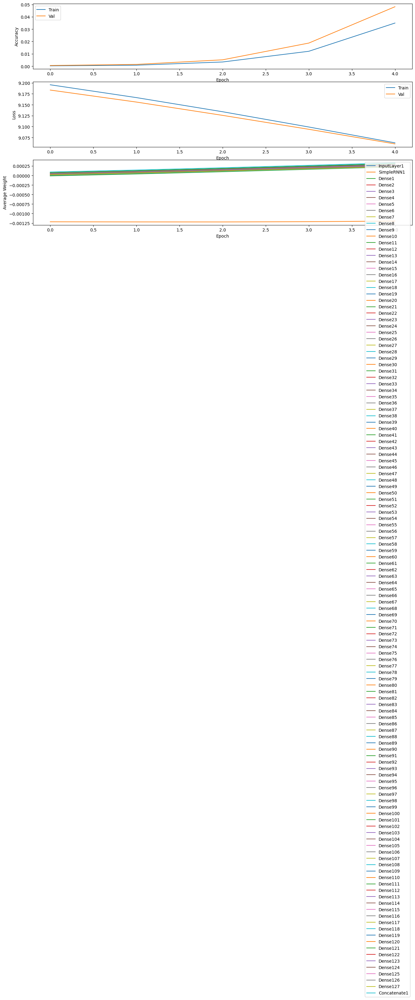

In [ ]:
plt.figure(figsize=(16,16))

plt.subplot(5,1,1)
plt.plot('epoch','train_accuracy',data=model_df,label="Train")
plt.plot('epoch','val_accuracy',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(5,1,2)
plt.plot('epoch','train_loss',data=model_df,label="Train")
plt.plot('epoch','val_loss',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(5,1,3)
for col in model_layers.columns:
  plt.plot(model_layers.index,col,data=model_layers,label=col)
plt.xlabel("Epoch")
plt.ylabel("Average Weight")
plt.legend()

plt.show()

In [ ]:
test_pred = rnn_model.predict(X_test_final, steps=steps_per_epoch)

48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step


In [ ]:
y_test_argmax = np.argmax(y_test_final,axis=2)
test_pred_argmax = np.argmax(test_pred,axis=2)
for row in range(len(y_test_final)):
  eq = 0
  if np.array_equal(y_test_argmax[row],test_pred_argmax[row]):
    eq += 1
acc = eq/len(y_test_final)
acc

0.0

In [ ]:
test_pred_argmax

array([[   0, 7940, 6538, ..., 2083,   53,  252],
       [1533, 9453, 1217, ..., 5853, 5943,  555],
       [8190,    0,    0, ...,  985, 5431, 5380],
       ...,
       [8095,    0,    0, ..., 3243,   40, 4844],
       [6615, 4414, 1402, ...,  834, 9102, 5204],
       [4749,  679, 2725, ...,  229, 5431, 3112]])

In [ ]:
def create_rnn_adam_update(learning_rate=0.00003,beta_1=0.9,beta_2=0.999):
    input_shape = (1, 233)
    inputs = Input(shape=input_shape)
    model = SimpleRNN(50, activation='tanh', return_sequences=True)(inputs)
    model = Dropout(0.2)(model)
    model = add_output_layer(model,10,50)
    outlist = []
    for out in range(127):
        outlist += [Dense(10000, activation='softmax')(model)]
    #opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
    opt = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2)
    #final_model = Model(inputs=inputs, outputs=outdict.keys())
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    # Uses MSE as loss function, typical for regression task
    return final_model
rnn_model_adam_update = create_rnn_adam_update()
type(rnn_model_adam_update)
rnn_model_adam_update.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 1, 233)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_55 (SimpleRNN) │ (None, 1, 50)          │         14,200 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 1, 50)          │              0 │ simple_rnn_55[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_56 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ dropout_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_57 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_56[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_58 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_57[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_59 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_58[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_60 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_59[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_61 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_60[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_62 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_61[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_63 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_62[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_64 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_63[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_65 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_64[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_635 (Dense)         │ (None, 1, 10000)       │        510,000 │ simple_rnn_65[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_636 (Dense)         │ (None, 1, 10000)       │        510,000 │ simple_rnn_65[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_637 (Dense)         │ (None, 1, 10000)       │        510,000 │ simple_rnn_65[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_638 (Dense)         │ (None, 1, 10000)       │        510,000 │ simple_rnn_65[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_639 (Dense)         │ (None, 1, 10000)       │        510,000 │ simple_rnn_65[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_640 (Dense)         │ (None, 1, 10000)       │        510,000 │ simple_rnn_65[0][0]    │
├──────────────────────

 Total params: 64,834,700 (247.32 MB)

 Trainable params: 64,834,700 (247.32 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
rnn_model_adam_update_history = rnn_model_adam_update.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback(),EarlyStopping()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - categorical_accuracy: 0.0039 - loss: 9.2097 - val_categorical_accuracy: 0.0185 - val_loss: 9.2063
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - categorical_accuracy: 0.0233 - loss: 9.2041 - val_categorical_accuracy: 0.0422 - val_loss: 9.1949
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - categorical_accuracy: 0.0579 - loss: 9.1865 - val_categorical_accuracy: 0.1125 - val_loss: 9.1542
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 127s 3s/step - categorical_accuracy: 0.1619 - loss: 9.1242 - val_categorical_accuracy: 0.4364 - val_loss: 9.0184
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 128s 3s/step - categorical_accuracy: 0.5099 - loss: 8.9177 - val_categorical_accuracy: 0.7444 - val_loss: 8.5908


In [ ]:
test_pred = rnn_model_adam_update.predict(X_test_final, steps=steps_per_epoch)
y_test_argmax = np.argmax(y_test_final,axis=2)
test_pred_argmax = np.argmax(test_pred,axis=2)
for row in range(len(y_test_final)):
  eq = 0
  if np.array_equal(y_test_argmax[row],test_pred_argmax[row]):
    eq += 1
acc = eq/len(y_test_final)
acc

48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step


0.0

In [ ]:
test_pred_argmax

array([[   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824],
       ...,
       [   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824]])

In [ ]:
np.unique(test_pred_argmax,axis=0)

array([[   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824],
       ...,
       [   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824],
       [   0,    0,    0, ...,  151, 1199,  824]])

In [ ]:
np.unique(test_pred_argmax,axis=0).shape

(32, 127)

In [ ]:
for row in np.unique(test_pred_argmax,axis=0):
  print(target_tokenizer.sequences_to_texts([row]))

['costume work range place end acknowledging going autistic right becoming social go everybody change table youtube']
['costume work range place end acknowledging going word right becoming social go everybody change table youtube']
['costume work range place end capitalism acknowledging going autistic also right becoming social go everybody change table youtube']
['costume work range place end capitalism acknowledging going word also right becoming social go everybody change table youtube']
['costume work range place end minute capitalism acknowledging going word also right becoming social go everybody change table youtube']
['costume work range place end minute capitalism acknowledging going word involved also right becoming social go everybody change table youtube']
['costume work range place end website capitalism acknowledging going autistic also right becoming social go everybody change table youtube']
['costume work range place end website capitalism acknowledging going autistic 

In [ ]:
#Function to add layers with Leaky ReLU activation with given slope
@keras.utils.register_keras_serializable(package="my_package", name="add_layer_lr")
def add_layer_lr(model,num_layer,neurons,slope):
  act = tf.keras.layers.LeakyReLU(negative_slope=slope)
  for i in range(num_layer):
    if i==0:
      layer = SimpleRNN(neurons, activation=act, return_sequences=True)(model)
    else:
      layer = SimpleRNN(neurons, activation=act, return_sequences=True)(layer)
    #output_list += [layer]
  #return output_list
  return layer

In [ ]:
def create_rnn_lr(slope=0.5):
    input_shape = (1, 233)
    inputs = Input(shape=input_shape)
    model = SimpleRNN(50, activation='tanh', return_sequences=True)(inputs)
    model = add_layer_lr(model,5,50,slope)
    outlist = []
    for out in range(127):
        modellayer = add_layer_lr(model,5,50,slope)
        outlist += [Dense(10000, activation='softmax')(modellayer)]
    #opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
    opt = tf.keras.optimizers.Adam(learning_rate=0.000001, beta_1=0.9, beta_2=0.999)
    #final_model = Model(inputs=inputs, outputs=outdict.keys())
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    # Uses MSE as loss function, typical for regression task
    return final_model
rnn_model_lr = create_rnn_lr()
type(rnn_model_lr)
rnn_model_lr.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 233)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn (SimpleRNN)    │ (None, 1, 50)          │         14,200 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_1 (SimpleRNN)  │ (None, 1, 50)          │          5,050 │ simple_rnn[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_2 (SimpleRNN)  │ (None, 1, 50)          │          5,050 │ simple_rnn_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_3 (SimpleRNN)  │ (None, 1, 50)          │          5,050 │ simple_rnn_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_4 (SimpleRNN)  │ (None, 1, 50)          │          5,050 │ simple_rnn_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_5 (SimpleRNN)  │ (None, 1, 50)          │          5,050 │ simple_rnn_4[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_6 (SimpleRNN)  │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_11 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_16 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_21 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_26 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_31 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_36 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_41 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_46 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_51 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_56 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_61 (SimpleRNN) │ (None, 1, 50)          │          5,050 │ simple_rnn_5[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_66 (Simple

 Total params: 68,016,200 (259.46 MB)

 Trainable params: 68,016,200 (259.46 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
rnn_model_lr_history = rnn_model_lr.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 786s 4s/step - categorical_accuracy: 7.7103e-05 - loss: 9.2104 - val_categorical_accuracy: 2.0505e-05 - val_loss: 9.2100
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - categorical_accuracy: 8.2150e-05 - loss: 9.2099 - val_categorical_accuracy: 4.6137e-05 - val_loss: 9.2095
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - categorical_accuracy: 8.6631e-05 - loss: 9.2094 - val_categorical_accuracy: 4.6137e-05 - val_loss: 9.2090
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - categorical_accuracy: 1.0500e-04 - loss: 9.2089 - val_categorical_accuracy: 7.6895e-05 - val_loss: 9.2085
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 116s 2s/step - categorical_accuracy: 9.4069e-05 - loss: 9.2084 - val_categorical_accuracy: 6.6642e-05 - val_loss: 9.2080


In [ ]:
def create_gru(input_shape):
    input_shape = input_shape
    inputs = Input(shape=input_shape)
    model = GRU(50, activation='tanh', return_sequences=True)(inputs)
    outlist = []
    for out in range(127):
        outlist += [Dense(10000, activation='softmax')(model)]
    opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    return final_model

# Example input shape, will be in form of our data
input_shape = (X_train_final.shape[1],X_train_final.shape[2])  # 2 features, 1 row per input
#inp_shape = (1,1001)
#input_shape = (None,X_train_final.shape[2])
gru_model = create_gru(input_shape)
type(gru_model)
gru_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 1, 233)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru (GRU)                 │ (None, 1, 50)          │         42,750 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_127 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_128 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_129 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_130 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_131 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_132 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_133 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_134 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_135 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_136 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_137 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_138 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_139 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_140 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_141 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_142 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_143 (Dense)         │ (None, 1, 10000)       │        510,000 │ gru[0][0]              │
├──────────────────────

 Total params: 64,812,750 (247.24 MB)

 Trainable params: 64,812,750 (247.24 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
gru_model_history = gru_model.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback()])

Epoch 1/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 126s 2s/step - categorical_accuracy: 0.2006 - loss: 9.0675 - val_categorical_accuracy: 0.8248 - val_loss: 8.3390
Epoch 2/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - categorical_accuracy: 0.8371 - loss: 7.8305 - val_categorical_accuracy: 0.8428 - val_loss: 5.9376
Epoch 3/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 93s 2s/step - categorical_accuracy: 0.8415 - loss: 5.0206 - val_categorical_accuracy: 0.8432 - val_loss: 2.6808
Epoch 4/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - categorical_accuracy: 0.8410 - loss: 2.2050 - val_categorical_accuracy: 0.8423 - val_loss: 1.8687
Epoch 5/5
53/53 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - categorical_accuracy: 0.8397 - loss: 1.5747 - val_categorical_accuracy: 0.8431 - val_loss: 1.7883


In [ ]:
@keras.utils.register_keras_serializable(package="my_package", name="add_layer")
def add_output_layer_gru(model,num_layer,neurons):
  #output_list = []
  for i in range(num_layer):
    if i==0:
      layer = GRU(neurons, activation='relu', return_sequences=True)(model)
    else:
      layer = GRU(neurons, activation='relu', return_sequences=True)(layer)
  return layer

In [ ]:
def create_gru_add_layers(num_layer=5,neurons=50):
    input_shape = (1, 233)
    inputs = Input(shape=input_shape)
    model = GRU(50, activation='tanh', return_sequences=True)(inputs)
    outlist = []
    for out in range(127):
        model = Dropout(0.2)(model)
        modellayer = add_output_layer_gru(model,num_layer,neurons)
        outlist += [Dense(10000, activation='softmax')(modellayer)]
    opt = tf.keras.optimizers.Adam(learning_rate=0.000001, beta_1=0.9, beta_2=0.999)
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    return final_model
gru_model_add_layers = create_gru_add_layers()
type(gru_model_add_layers)
gru_model_add_layers.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 233)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru (GRU)                 │ (None, 1, 50)          │         42,750 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 1, 50)          │              0 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1, 50)          │              0 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_6 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_7 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_6[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_11 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_11[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_13 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_14 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_13[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_15 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_14[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_16 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_15[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_17 (Dropout) 

 Total params: 74,528,250 (284.30 MB)

 Trainable params: 74,528,250 (284.30 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
gru_model_add_layers_history = gru_model_add_layers.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback(),EarlyStopping()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1101s 5s/step - categorical_accuracy: 0.7051 - loss: 9.2104 - val_categorical_accuracy: 0.0298 - val_loss: 9.2103
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 114s 2s/step - categorical_accuracy: 0.7133 - loss: 9.2103 - val_categorical_accuracy: 0.2332 - val_loss: 9.2102
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 120s 3s/step - categorical_accuracy: 0.7229 - loss: 9.2103 - val_categorical_accuracy: 0.4778 - val_loss: 9.2101
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 116s 2s/step - categorical_accuracy: 0.7384 - loss: 9.2101 - val_categorical_accuracy: 0.6336 - val_loss: 9.2100
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 121s 3s/step - categorical_accuracy: 0.7590 - loss: 9.2101 - val_categorical_accuracy: 0.7208 - val_loss: 9.2100


In [ ]:
model_df = pd.DataFrame(columns=['epoch','train_accuracy','val_accuracy','train_loss','val_loss'])
model_df['epoch'] = gru_model_add_layers_history.epoch
model_df['train_accuracy'] = gru_model_add_layers_history.history['categorical_accuracy']
model_df['val_accuracy'] = gru_model_add_layers_history.history['val_categorical_accuracy']
model_df['train_loss'] = gru_model_add_layers_history.history['loss']
model_df['val_loss'] = gru_model_add_layers_history.history['val_loss']

name = []
for layer in gru_model_add_layers.layers:
  name += [str(type(layer)).split("'")[1].split(".")[5]]
name_count = pd.Series(name).value_counts()
name_count_dict = name_count.to_dict()
for i in name_count_dict.keys():
  start = 0
  for j in range(name_count_dict[i]):
    ind = name.index(i,start)
    name[ind] = str(name[ind]) + str(j + 1)
    start = j + 1
model_layers = pd.DataFrame(columns=name)
for i,w in enumerate(gru_model_add_layers.all_weights):
  model_layers.loc[i] = w

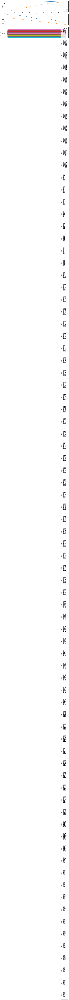

In [ ]:
plt.figure(figsize=(16,16))

plt.subplot(5,1,1)
plt.plot('epoch','train_accuracy',data=model_df,label="Train")
plt.plot('epoch','val_accuracy',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(5,1,2)
plt.plot('epoch','train_loss',data=model_df,label="Train")
plt.plot('epoch','val_loss',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(5,1,3)
for col in model_layers.columns:
  plt.plot(model_layers.index,col,data=model_layers,label=col)
plt.xlabel("Epoch")
plt.ylabel("Average Weight")
plt.legend()

plt.show()

In [ ]:
test_pred = gru_model_add_layers.predict(X_test_final, steps=steps_per_epoch)
y_test_argmax = np.argmax(y_test_final,axis=2)
test_pred_argmax = np.argmax(test_pred,axis=2)
for row in range(len(y_test_final)):
  eq = 0
  if np.array_equal(y_test_argmax[row],test_pred_argmax[row]):
    eq += 1
acc = eq/len(y_test_final)
acc

48/48 ━━━━━━━━━━━━━━━━━━━━ 101s 91ms/step


0.0

In [ ]:
test_pred_argmax

array([[   0,    0,    0, ...,    7,    9,   46],
       [   0,    0,    0, ..., 1021,   89,   46],
       [   0,    0,    0, ...,    7,   68,   46],
       ...,
       [   0,    0,    0, ..., 1021,   89,   20],
       [   0,    0,    0, ..., 1021,    4,   20],
       [   0,    0,    0, ..., 1021,   89, 6856]])

In [ ]:
#Function to add layers with Leaky ReLU activation with given slope
@keras.utils.register_keras_serializable(package="my_package", name="add_layer_lr")
def add_layer_gru_lr(model,num_layer,neurons,slope):
  act = tf.keras.layers.LeakyReLU(negative_slope=slope)
  for i in range(num_layer):
    if i==0:
      layer = GRU(neurons, activation=act, return_sequences=True)(model)
    else:
      layer = GRU(neurons, activation=act, return_sequences=True)(layer)
    #output_list += [layer]
  #return output_list
  return layer

In [ ]:
def create_gru_lr(slope=0.5):
    input_shape = (1, 233)
    inputs = Input(shape=input_shape)
    model = GRU(50, activation='tanh', return_sequences=True)(inputs)
    #model = add_layer_lr(model,5,50,slope)
    outlist = []
    for out in range(127):
        model = Dropout(0.2)(model)
        modellayer = add_layer_gru_lr(model,5,50,slope)
        outlist += [Dense(10000, activation='softmax')(modellayer)]
    #opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
    opt = tf.keras.optimizers.Adam(learning_rate=0.000001, beta_1=0.9, beta_2=0.999)
    #final_model = Model(inputs=inputs, outputs=outdict.keys())
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    # Uses MSE as loss function, typical for regression task
    return final_model
gru_model_lr = create_gru_lr()
type(gru_model_lr)
gru_model_lr.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 233)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru (GRU)                 │ (None, 1, 50)          │         42,750 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 1, 50)          │              0 │ gru[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1, 50)          │              0 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_6 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_7 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_6[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 1, 50)          │              0 │ dropout_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_11 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_11[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_13 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_14 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_13[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_15 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_14[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_16 (Dropout)      │ (None, 1, 50)          │              0 │ dropout_15[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_17 (Dropout) 

 Total params: 74,528,250 (284.30 MB)

 Trainable params: 74,528,250 (284.30 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
gru_model_lr_history = gru_model_lr.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback(),EarlyStopping()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1006s 4s/step - categorical_accuracy: 0.7054 - loss: 9.2105 - val_categorical_accuracy: 0.0029 - val_loss: 9.2103
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - categorical_accuracy: 0.7051 - loss: 9.2104 - val_categorical_accuracy: 0.0348 - val_loss: 9.2102
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - categorical_accuracy: 0.7023 - loss: 9.2114 - val_categorical_accuracy: 0.1510 - val_loss: 9.2101
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - categorical_accuracy: 0.7064 - loss: 9.2104 - val_categorical_accuracy: 0.3308 - val_loss: 9.2100
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - categorical_accuracy: 0.7102 - loss: 9.2101 - val_categorical_accuracy: 0.5011 - val_loss: 9.2099


In [ ]:
model_df = pd.DataFrame(columns=['epoch','train_accuracy','val_accuracy','train_loss','val_loss'])
model_df['epoch'] = gru_model_lr_history.epoch
model_df['train_accuracy'] = gru_model_lr_history.history['categorical_accuracy']
model_df['val_accuracy'] = gru_model_lr_history.history['val_categorical_accuracy']
model_df['train_loss'] = gru_model_lr_history.history['loss']
model_df['val_loss'] = gru_model_lr_history.history['val_loss']

name = []
for layer in gru_model_lr.layers:
  name += [str(type(layer)).split("'")[1].split(".")[5]]
name_count = pd.Series(name).value_counts()
name_count_dict = name_count.to_dict()
for i in name_count_dict.keys():
  start = 0
  for j in range(name_count_dict[i]):
    ind = name.index(i,start)
    name[ind] = str(name[ind]) + str(j + 1)
    start = j + 1
model_layers = pd.DataFrame(columns=name)
for i,w in enumerate(gru_model_lr.all_weights):
  model_layers.loc[i] = w

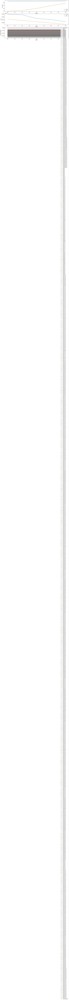

In [ ]:
plt.figure(figsize=(16,16))

plt.subplot(5,1,1)
plt.plot('epoch','train_accuracy',data=model_df,label="Train")
plt.plot('epoch','val_accuracy',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(5,1,2)
plt.plot('epoch','train_loss',data=model_df,label="Train")
plt.plot('epoch','val_loss',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(5,1,3)
for col in model_layers.columns:
  plt.plot(model_layers.index,col,data=model_layers,label=col)
plt.xlabel("Epoch")
plt.ylabel("Average Weight")
plt.legend()

plt.show()

In [ ]:
import pickle
with open('gru_model.pkl','wb') as f:
  pickle.dump(gru_model_lr,f)

In [ ]:
test_pred = gru_model_lr.predict(X_test_final, steps=steps_per_epoch)
y_test_argmax = np.argmax(y_test_final,axis=2)
test_pred_argmax = np.argmax(test_pred,axis=2)
for row in range(len(y_test_final)):
  eq = 0
  if np.array_equal(y_test_argmax[row],test_pred_argmax[row]):
    eq += 1
acc = eq/len(y_test_final)
acc

48/48 ━━━━━━━━━━━━━━━━━━━━ 105s 104ms/step


0.0

In [ ]:
test_pred_argmax

array([[3908,    0,    0, ...,   35,  430, 3137],
       [   0,    0,    0, ...,   68,  121,  369],
       [   0,    0,    0, ..., 3496, 1411,  826],
       ...,
       [6781,    0,    0, ..., 1561,   89, 1407],
       [   0,    0,    0, ..., 1873, 1196,  494],
       [4115,    0,    0, ..., 5224, 1700,  826]])

In [ ]:
np.unique(test_pred_argmax,axis=0)

array([[   0,    0,    0, ...,    0,   35,   11],
       [   0,    0,    0, ...,    0,  616,  340],
       [   0,    0,    0, ...,   68,  121,  369],
       ...,
       [9871,    0,    0, ...,   33,  955, 2713],
       [9973,    0,    0, ...,   67, 4023,   44],
       [9993,    0, 4823, ..., 1098,  428, 2742]])

In [ ]:
np.unique(test_pred_argmax,axis=0).shape

(321, 127)

In [ ]:
for row in np.unique(test_pred_argmax,axis=0):
  print(target_tokenizer.sequences_to_texts([row]))

["still ''"]
["feeling feedback feel think learning humane practice hospitalization comment reaction raise nail saving mutism var already photography ignorance sometimes family withheld 1990 famous flight activated trust 's actually find neurotypical disorder included encourage sun put vegan glass rambling put toy asked"]
['mich joy best switched approachable ignorant leash htm restrict talk scary interpret ‘ documentary brow absolutely skill adjacent feel couple sherlock mam goblin easiest never take set dramatic alone racist ignorance die expression depression diagnosis particularly exist useful recommend farther disorder success probably take sun ” could hope sweet couple get school definitely hurt']
["disposable elon disabled comical po gift steal sting 5 inflammation lamb invalidate portfolio adjacent fwiw 's '' existed alone worse suffering jason particularly person opinion 3 speech much mutism end people experience lie affected attribute know adopting rough even com going"]
['cr

In [ ]:
predict_df = pd.DataFrame(columns=['parent_body','final_autism_ind','comment_body_actual','comment_body_predicted'])
for i in range(len(X_test_final_new)):
  predict_df.loc[i,'parent_body'] = tokenizer.sequences_to_texts([X_test_final_new.loc[i][body_col]])[0]
  predict_df.loc[i,'final_autism_ind'] = X_test_final_new.loc[i]['final_autism_ind']
  predict_df.loc[i,'comment_body_actual'] = target_tokenizer.sequences_to_texts([y_test_final_new.loc[i][targ_col]])[0]
  predict_df.loc[i,'comment_body_predicted'] = target_tokenizer.sequences_to_texts([test_pred_argmax[i]])[0]
predict_df

,parent_body,final_autism_ind,comment_body_actual,comment_body_predicted
0,approach class hi everyone slowly away class c...,1,course tip tab right usually note guide and or...,sour pretzel taco current consumed bent acting...
1,copy editor yes oxford comma life — also ap fr...,1,wait 🤣,mich joy best switched approachable ignorant l...
2,yes see comment thank many option hard decide ...,1,highly recommend one place right across street...,dirt hide ballot consent tailor agency implica...
3,get upset read post title bot posting comment ...,1,autistic misunderstand nuance thought upset fr...,severity meant poor report mich consent often ...
4,remember even millennial entering workforce ev...,1,true gen x coworker job tell slow going work j...,adore employed gravitate 'no democratic unders...
...,...,...,...,...
331,thought collecting painting never playing coll...,1,collecting painting 19 year short time played ...,neurotypicals punched jess visually fact final...
332,left read regularly people immediately respond...,1,learned something valuable thread today always...,drs addicted awesome none candy sudden paterna...
333,generally yes usually see probably best time,1,see angry mad,opted textured einfach link emojis often 8 mak...
334,99 sure sister straight lying kid ’ wellbeing ...,0,said would leave sub one good one appreciate d...,dirt interact peeve 12yo puppet unfair upon re...


In [ ]:
predict_df.to_csv('autism_response_predict.csv')

In [ ]:
sample_question = ['how is the weather','how is the weather','what are up to today','what are up to today','what do do for work','what do do for work','what do like to do','what do like to do']
sample_autism_ind = [0,1,0,1,0,1,0,1]
sample_question_df = pd.DataFrame(columns=['parent_body'])
for i in range(len(sample_question)):
  sample_question_df.loc[i,'parent_body'] = sample_question[i]
  sample_question_df.loc[i,'final_autism_ind'] = sample_autism_ind[i]
sample_question_df

,parent_body,final_autism_ind
0,how is the weather,0.0
1,how is the weather,1.0
2,what are up to today,0.0
3,what are up to today,1.0
4,what do do for work,0.0
5,what do do for work,1.0
6,what do like to do,0.0
7,what do like to do,1.0


In [ ]:
sample_question_seq = tokenizer.texts_to_sequences([str(sample_question_df.loc[i]['parent_body']) for i in range(len(sample_question_df))])
sample_question_pad_seq = [pad_sequences([sample_question_seq[i]], maxlen=1000)[0] for i in range(len(sample_question_seq))]
sample_question_dict = dict()
for i in range(768,1000):
  k = f"body{i}"
  v = []
  for j in range(len(sample_question_pad_seq)):
    v += [sample_question_pad_seq[j][i]]
  sample_question_dict[k] = v
sample_question_final = pd.DataFrame.from_dict(sample_question_dict)
sample_question_final['final_autism_ind'] = sample_question_df['final_autism_ind']
sample_question_final

,body768,body769,body770,body771,body772,body773,body774,body775,body776,body777,...,body991,body992,body993,body994,body995,body996,body997,body998,body999,final_autism_ind
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,3047,1955,1071,2389,0.0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,3047,1955,1071,2389,1.0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3175,5174,1593,978,194,0.0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3175,5174,1593,978,194,1.0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3175,2368,2368,3131,37,0.0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3175,2368,2368,3131,37,1.0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3175,2368,1,978,2368,0.0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3175,2368,1,978,2368,1.0


In [ ]:
sample_question_final_np = sample_question_final.to_numpy().reshape((sample_question_final.shape[0],1,sample_question_final.shape[1]))

In [ ]:
sample_pred = gru_model_lr.predict(sample_question_final_np, steps=steps_per_epoch)

48/48 ━━━━━━━━━━━━━━━━━━━━ 100s 11ms/step


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


In [ ]:
sample_pred_argmax = np.argmax(sample_pred,axis=2)
sample_pred_argmax

array([[6194,    0,    0, ...,  204,  231,   84],
       [6194,    0,    0, ...,  204,  231,   84],
       [4863,    0,    0, ...,   53, 2368,   44],
       ...,
       [7463,    0,    0, ...,   67, 1396, 3818],
       [9332,    0,    0, ...,  614, 3527,   44],
       [9332,    0,    0, ...,  614, 3527,   44]])

In [ ]:
sample_pred_argmax.shape

(8, 127)

In [ ]:
target_tokenizer.sequences_to_texts(sample_pred_argmax)

["fever pretzel piercings mask integration listening still shift sunscreen gift exactly com sort likelihood accessibility college outline progress archive answer joking absolutely rather cam daughter '' ganz sprayed flipping 300 already trouble going dear thing vendor prep making chart going useful always archive center income horrifying high childhood remote rule room draw baby vegan example something mentioning heard coming wanted ago come",
 "fever pretzel piercings mask integration listening still shift sunscreen gift exactly com sort likelihood accessibility college outline progress archive answer joking absolutely rather cam daughter '' ganz sprayed flipping 300 already trouble going dear thing vendor prep making chart going useful always archive center income horrifying high childhood remote rule room draw baby vegan example something mentioning heard coming wanted ago come",
 "voor aromantic washing continuing mediterranean pledge despite still person service sort discourage lo

In [ ]:
predict_sample_df = pd.DataFrame(columns=['parent_body','final_autism_ind','comment_body_predicted'])
predict_sample_df['comment_body_predicted'] = target_tokenizer.sequences_to_texts(sample_pred_argmax)
predict_sample_df['parent_body'] = sample_question_df['parent_body']
predict_sample_df['final_autism_ind'] = sample_question_df['final_autism_ind']
predict_sample_df

,parent_body,final_autism_ind,comment_body_predicted
0,how is the weather,0.0,fever pretzel piercings mask integration liste...
1,how is the weather,1.0,fever pretzel piercings mask integration liste...
2,what are up to today,0.0,voor aromantic washing continuing mediterranea...
3,what are up to today,1.0,voor aromantic washing continuing mediterranea...
4,what do do for work,0.0,leisure redditor pretzel cold current mango st...
5,what do do for work,1.0,leisure redditor pretzel cold current mango st...
6,what do like to do,0.0,welp slipping childhood prank describe farmer ...
7,what do like to do,1.0,welp slipping childhood prank describe farmer ...


In [ ]:
predict_sample_df.to_csv('autism_sample_predict.csv')

In [ ]:
def create_lstm(input_shape):
    input_shape = input_shape
    inputs = Input(shape=input_shape)
    model = LSTM(50, activation='tanh', return_sequences=True)(inputs)
    outlist = []
    for out in range(127):
        outlist += [Dense(10000, activation='softmax')(model)]
    opt = tf.keras.optimizers.Adam(learning_rate=0.00000001, beta_1=0.9, beta_2=0.999)
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    return final_model

# Example input shape, will be in form of our data
input_shape = (X_train_final.shape[1],X_train_final.shape[2])  # 2 features, 1 row per input
#inp_shape = (1,1001)
#input_shape = (None,X_train_final.shape[2])
lstm_model = create_lstm(input_shape)
type(lstm_model)
lstm_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 233)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 50)          │         56,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_14 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 1, 10000)       │        510,000 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_17 (Dense)     

 Total params: 64,826,800 (247.29 MB)

 Trainable params: 64,826,800 (247.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
lstm_model_history = lstm_model.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 129s 2s/step - categorical_accuracy: 1.0296e-04 - loss: 9.2115 - val_categorical_accuracy: 9.7400e-05 - val_loss: 9.2115
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - categorical_accuracy: 9.4161e-05 - loss: 9.2114 - val_categorical_accuracy: 9.2274e-05 - val_loss: 9.2115
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - categorical_accuracy: 8.7724e-05 - loss: 9.2114 - val_categorical_accuracy: 9.2274e-05 - val_loss: 9.2114
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - categorical_accuracy: 1.0452e-04 - loss: 9.2114 - val_categorical_accuracy: 9.2274e-05 - val_loss: 9.2115
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - categorical_accuracy: 1.1648e-04 - loss: 9.2116 - val_categorical_accuracy: 9.2274e-05 - val_loss: 9.2115


In [15]:
def add_output_layer_lstm(model,num_layer,neurons):
  #output_list = []
  for i in range(num_layer):
    if i==0:
      layer = LSTM(neurons, activation='relu', return_sequences=True)(model)
    else:
      layer = LSTM(neurons, activation='relu', return_sequences=True)(layer)
    #output_list += [layer]
  #return output_list
  return layer

In [16]:
def create_lstm_add_layers(num_layer=5,neurons=50):
    input_shape = (1, 233)
    inputs = Input(shape=input_shape)
    model = LSTM(50, activation='tanh', return_sequences=True)(inputs)
    outlist = []
    for out in range(127):
        modellayer = add_output_layer_lstm(model,num_layer,neurons)
        outlist += [Dense(10000, activation='softmax')(modellayer)]
    #opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
    opt = tf.keras.optimizers.Adam(learning_rate=0.00000001, beta_1=0.9, beta_2=0.999)
    #final_model = Model(inputs=inputs, outputs=outdict.keys())
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    # Uses MSE as loss function, typical for regression task
    return final_model
lstm_model_add_layers = create_lstm_add_layers()
type(lstm_model_add_layers)
lstm_model_add_layers.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 1, 233)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_636 (LSTM)           │ (None, 1, 50)          │         56,800 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_637 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_642 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_647 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_652 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_657 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_662 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_667 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_672 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_677 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_682 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_687 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_692 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_697 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_702 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_707 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_712 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_717 (LSTM)           │ (None, 1, 50)          │         20,200 │ lstm_636[0][0]         │
├──────────────────────

 Total params: 77,653,800 (296.23 MB)

 Trainable params: 77,653,800 (296.23 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
lstm_model_add_layers_history = lstm_model_add_layers.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1038s 5s/step - categorical_accuracy: 0.0017 - loss: 9.2103 - val_categorical_accuracy: 0.0327 - val_loss: 9.2103
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 128s 3s/step - categorical_accuracy: 0.0646 - loss: 9.2103 - val_categorical_accuracy: 0.2296 - val_loss: 9.2103
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 134s 3s/step - categorical_accuracy: 0.2778 - loss: 9.2103 - val_categorical_accuracy: 0.4636 - val_loss: 9.2103
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - categorical_accuracy: 0.4944 - loss: 9.2103 - val_categorical_accuracy: 0.6245 - val_loss: 9.2103
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 133s 3s/step - categorical_accuracy: 0.6419 - loss: 9.2103 - val_categorical_accuracy: 0.7202 - val_loss: 9.2103


In [ ]:
import pickle
with open('lstm_model.pkl','wb') as f:
  pickle.dump(lstm_model_add_layers,f)

In [19]:
model_df = pd.DataFrame(columns=['epoch','train_accuracy','val_accuracy','train_loss','val_loss'])
model_df['epoch'] = lstm_model_add_layers_history.epoch
model_df['train_accuracy'] = lstm_model_add_layers_history.history['categorical_accuracy']
model_df['val_accuracy'] = lstm_model_add_layers_history.history['val_categorical_accuracy']
model_df['train_loss'] = lstm_model_add_layers_history.history['loss']
model_df['val_loss'] = lstm_model_add_layers_history.history['val_loss']

# name = []
# for layer in lstm_model_add_layers.layers:
#   name += [str(type(layer)).split("'")[1].split(".")[5]]
# name_count = pd.Series(name).value_counts()
# name_count_dict = name_count.to_dict()
# for i in name_count_dict.keys():
#   start = 0
#   for j in range(name_count_dict[i]):
#     ind = name.index(i,start)
#     name[ind] = str(name[ind]) + str(j + 1)
#     start = j + 1
# model_layers = pd.DataFrame(columns=name)
# for i,w in enumerate(lstm_model_add_layers.all_weights):
#   model_layers.loc[i] = w

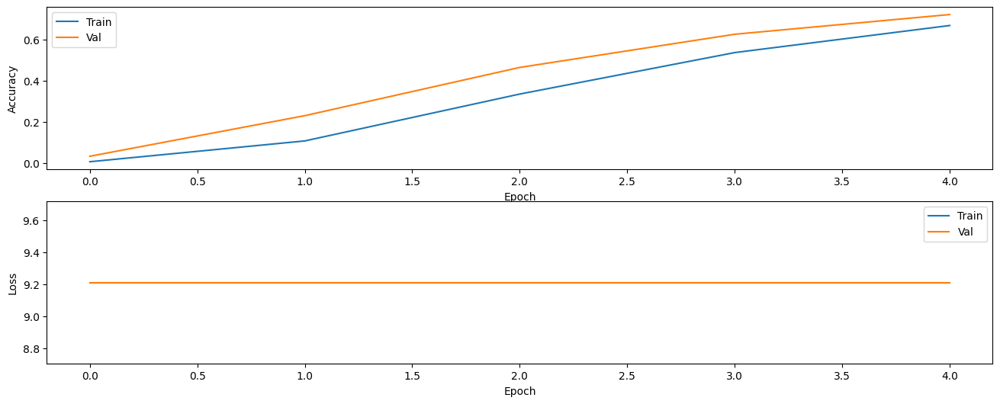

In [20]:
plt.figure(figsize=(16,16))

plt.subplot(5,1,1)
plt.plot('epoch','train_accuracy',data=model_df,label="Train")
plt.plot('epoch','val_accuracy',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(5,1,2)
plt.plot('epoch','train_loss',data=model_df,label="Train")
plt.plot('epoch','val_loss',data=model_df,label='Val')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# plt.subplot(5,1,3)
# for col in model_layers.columns:
#   plt.plot(model_layers.index,col,data=model_layers,label=col)
# plt.xlabel("Epoch")
# plt.ylabel("Average Weight")
# plt.legend()

plt.show()

In [21]:
np.argmax(y_test_final,axis=2)

array([[   0,    0,    0, ..., 1199, 5861,  356],
       [   0,    0,    0, ...,    0,  436, 1315],
       [   0,    0,    0, ..., 2067, 8686, 1173],
       ...,
       [   0,    0,    0, ...,   37,  886,  906],
       [   0,    0,    0, ...,   20,  204,    9],
       [   0,    0,    0, ..., 5256, 9371,   93]])

In [22]:
test_pred = lstm_model_add_layers.predict(X_test_final, steps=steps_per_epoch)

48/48 ━━━━━━━━━━━━━━━━━━━━ 89s 101ms/step


In [23]:
np.argmax(test_pred,axis=2)

array([[2147, 1783, 3820, ...,  694, 2246, 8210],
       [1108, 8633, 4175, ..., 6318, 1038, 3737],
       [1108, 1783, 3229, ..., 8413, 5782, 3737],
       ...,
       [9756, 1783, 7940, ..., 7892, 3164, 4320],
       [9756, 1783, 4175, ..., 9392, 2246, 7669],
       [9756, 1783, 7701, ..., 6318, 1098, 3737]])

In [ ]:
def add_layer_lstm_lr(model,num_layer,neurons,slope):
  act = tf.keras.layers.LeakyReLU(negative_slope=slope)
  for i in range(num_layer):
    if i==0:
      layer = LSTM(neurons, activation=act, return_sequences=True)(model)
    else:
      layer = LSTM(neurons, activation=act, return_sequences=True)(layer)
    #output_list += [layer]
  #return output_list
  return layer

In [ ]:
def create_lstm_lr(slope=0.5):
    input_shape = (1, 233)
    inputs = Input(shape=input_shape)
    model = LSTM(50, activation='tanh', return_sequences=True)(inputs)
    #model = add_layer_lr(model,5,50,slope)
    outlist = []
    for out in range(127):
        modellayer = add_layer_lstm_lr(model,5,50,slope)
        outlist += [Dense(10000, activation='softmax')(modellayer)]
    #opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
    opt = tf.keras.optimizers.Adam(learning_rate=0.00000001, beta_1=0.9, beta_2=0.999)
    #final_model = Model(inputs=inputs, outputs=outdict.keys())
    final_model = Model(inputs=inputs, outputs=keras.layers.Concatenate(axis=1)(outlist))
    final_model.compile(optimizer=opt, loss=CategoricalCrossentropy(), metrics=[keras.metrics.CategoricalAccuracy()])
    # Uses MSE as loss function, typical for regression task
    return final_model
lstm_model_lr = create_lstm_lr()
type(lstm_model_lr)
lstm_model_lr.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 233)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 1, 50)          │         56,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_6 (LSTM)             │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_11 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_16 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_21 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_26 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_31 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_36 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_41 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_46 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_51 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_56 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_61 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_66 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_71 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_76 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_81 (LSTM)            │ (None, 1, 50)          │         20,200 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_86 (LSTM)       

 Total params: 77,653,800 (296.23 MB)

 Trainable params: 77,653,800 (296.23 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
lstm_model_lr_history = lstm_model_lr.fit(train_data, epochs=5, steps_per_epoch = steps_per_epoch, validation_steps = steps_per_epoch, validation_data=(val_data), callbacks=[customCallback()])

Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 1012s 4s/step - categorical_accuracy: 7.8128e-04 - loss: 9.2103 - val_categorical_accuracy: 0.0150 - val_loss: 9.2103
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - categorical_accuracy: 0.0350 - loss: 9.2103 - val_categorical_accuracy: 0.1453 - val_loss: 9.2103
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - categorical_accuracy: 0.1857 - loss: 9.2103 - val_categorical_accuracy: 0.3556 - val_loss: 9.2103
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 125s 3s/step - categorical_accuracy: 0.3918 - loss: 9.2103 - val_categorical_accuracy: 0.5441 - val_loss: 9.2103
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 122s 3s/step - categorical_accuracy: 0.5663 - loss: 9.2103 - val_categorical_accuracy: 0.6654 - val_loss: 9.2103


#Winning Model:

Gated Recurrent Unit Model

Input Layer: 50 neurons, tanh activation

5 Hidden Layers for each response variable: 50 neurons, leaky ReLU activation with slope 0.5

Output Layer for each response variable: 10000 neurons, softmax activation

Optimizer: Adam, learning rate 0.0000001, beta 1 0.9, beta 2 0.999

Accuracy: 71.02%

Cross Entropy: 9.2101